<h1>Table of Contents<span class="tocSkip"></span></h1>
<div class="toc"><ul class="toc-item"><li><span><a href="#Préparation-du-dataset" data-toc-modified-id="Préparation-du-dataset-1"><span class="toc-item-num">1&nbsp;&nbsp;</span>Préparation du dataset</a></span><ul class="toc-item"><li><span><a href="#Import-du-dataset" data-toc-modified-id="Import-du-dataset-1.1"><span class="toc-item-num">1.1&nbsp;&nbsp;</span>Import du dataset</a></span></li><li><span><a href="#Création-des-labels-des-photos-à-partir-du-nom-des-images" data-toc-modified-id="Création-des-labels-des-photos-à-partir-du-nom-des-images-1.2"><span class="toc-item-num">1.2&nbsp;&nbsp;</span>Création des labels des photos à partir du nom des images</a></span></li><li><span><a href="#Affichage-d'exemples-d'images-par-label" data-toc-modified-id="Affichage-d'exemples-d'images-par-label-1.3"><span class="toc-item-num">1.3&nbsp;&nbsp;</span>Affichage d'exemples d'images par label</a></span></li></ul></li><li><span><a href="#VGG16" data-toc-modified-id="VGG16-2"><span class="toc-item-num">2&nbsp;&nbsp;</span>VGG16</a></span><ul class="toc-item"><li><span><a href="#Visualisation-of-images-in-each-cluster" data-toc-modified-id="Visualisation-of-images-in-each-cluster-2.1"><span class="toc-item-num">2.1&nbsp;&nbsp;</span>Visualisation of images in each cluster</a></span></li></ul></li><li><span><a href="#ResNet50" data-toc-modified-id="ResNet50-3"><span class="toc-item-num">3&nbsp;&nbsp;</span>ResNet50</a></span><ul class="toc-item"><li><span><a href="#Visualisation-of-images-in-each-cluster" data-toc-modified-id="Visualisation-of-images-in-each-cluster-3.1"><span class="toc-item-num">3.1&nbsp;&nbsp;</span>Visualisation of images in each cluster</a></span></li></ul></li><li><span><a href="#Résultats" data-toc-modified-id="Résultats-4"><span class="toc-item-num">4&nbsp;&nbsp;</span>Résultats</a></span></li></ul></div>

# Préparation du dataset

## Import du dataset

In [1]:
import time,datetime
start_time = time.time()

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

from tqdm.notebook import tqdm_notebook, tnrange 
from tqdm.contrib import tenumerate

%matplotlib inline
from os import listdir

from scipy.optimize import linear_sum_assignment
from collections import Counter

import joblib

######### Sklearn  #################

# clustering and dimension reduction
from sklearn.cluster import KMeans
from sklearn.decomposition import PCA

# metrics
from sklearn.metrics import adjusted_rand_score
from sklearn.metrics import confusion_matrix,ConfusionMatrixDisplay,classification_report


######### KERAS  #################
# for loading/processing the images  
from keras.preprocessing.image import load_img 
from keras.preprocessing.image import img_to_array 
from keras.applications.vgg16 import preprocess_input 

# models 
from keras.applications.vgg16 import VGG16 
from keras.models import Model

In [2]:
path = r"C:/Users/demo/Desktop/Projet 06/Flipkart/Images/"
list_photos = [file for file in listdir(path)]
print(len(list_photos))

1050


In [3]:
Flipkart = pd.read_csv('../Flipkart/flipkart_com-ecommerce_sample_1050.csv',encoding='iso-8859-1')
Flipkart.head(5)

dataset=Flipkart[['product_category_tree','image']].copy()

In [4]:
# Renommage des catégories (legendes des matrices de confusion trop longues)
shorten={'Watches ':'Watches',
         'Computers ':'Computers',
         'Home Decor & Festive Needs ':'Decor',
         'Kitchen & Dining ':'Kitchen',
         'Home Furnishing ':'Furniture',
         'Beauty and Personal Care ':'Beauty',
         'Baby Care ':'Baby'}

In [5]:
# extraction du premier etage de l'arbre category affichages des occurences
dataset['category']=dataset.product_category_tree.apply(lambda s : s[2:s.find('>>')])
cat=pd.DataFrame(dataset.category.value_counts())
cat.reset_index(inplace=True)
cat['index'].replace(shorten,inplace=True)
cat

,index,category
0,Kitchen,150
1,Decor,150
2,Beauty,150
3,Furniture,150
4,Baby,150
5,Watches,150
6,Computers,150


In [6]:
# Shorten category names
dataset.category.replace(shorten,inplace=True)
dataset.category.value_counts()

Kitchen      150
Computers    150
Watches      150
Furniture    150
Decor        150
Beauty       150
Baby         150
Name: category, dtype: int64

In [7]:
# dictionaire pour ordinal encoding des noms de categories
# permatra de comparer avec les resultast du clustering
dico={cat.loc[i,'index']:i for i in cat.index}
dico_reverse={i:cat.loc[i,'index'] for i in cat.index}
display(dico)

# affectation à la colonne cat_code
dataset['cat_code']=dataset.category.replace(dico) 

# Essayer avec un transformer labelencoder pour encodage decodage

{'Kitchen': 0,
 'Decor': 1,
 'Beauty': 2,
 'Furniture': 3,
 'Baby': 4,
 'Watches': 5,
 'Computers': 6}

In [8]:
data=dataset[['category','cat_code','image']].copy()
# data=dataset[['category','cat_code','image']].sample(100)

data.head(2)

,category,cat_code,image
0,Furniture,3,55b85ea15a1536d46b7190ad6fff8ce7.jpg
1,Baby,4,7b72c92c2f6c40268628ec5f14c6d590.jpg


## Création des labels des photos à partir du nom des images

In [9]:
data.groupby('cat_code').count()

,category,image
cat_code,,
0,150,150
1,150,150
2,150,150
3,150,150
4,150,150
5,150,150
6,150,150


## Affichage d'exemples d'images par label

Sample category : Kitchen 


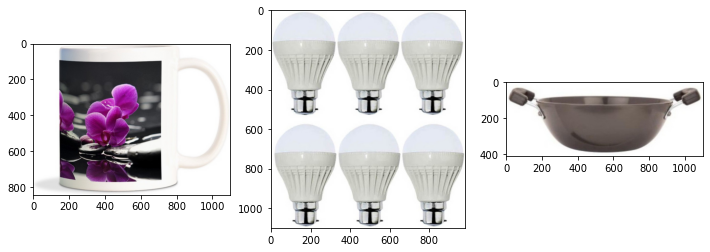

Sample category : Watches 


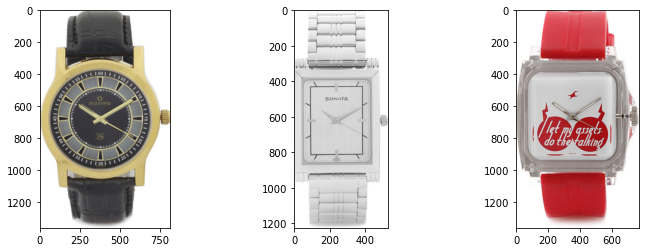

Sample category : Furniture 


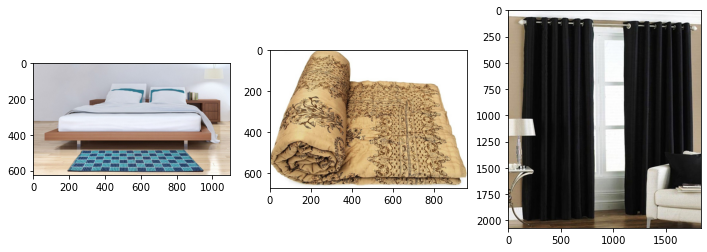

Sample category : Baby 


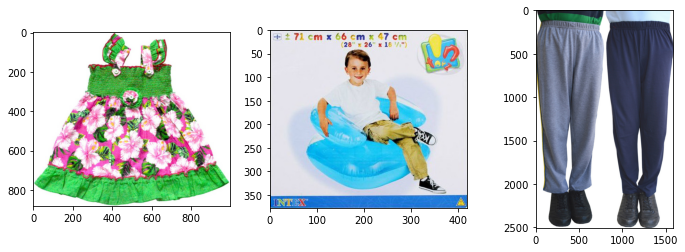

Sample category : Beauty 


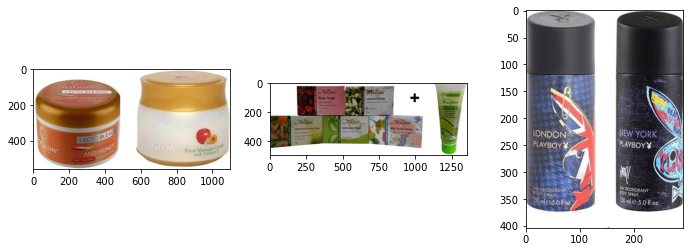

Sample category : Decor 


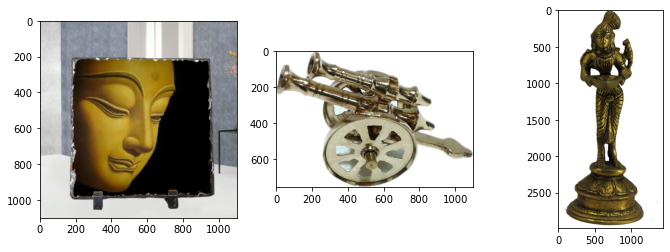

Sample category : Computers 


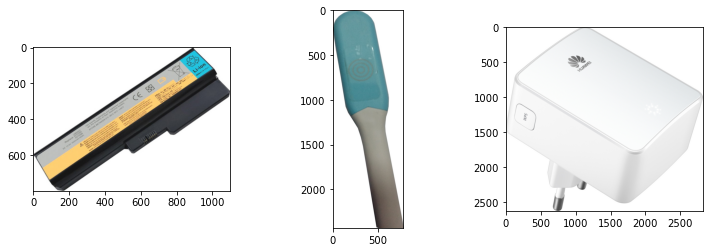

In [10]:
from matplotlib.image import imread

for categ in set(data.category):
    plt.figure(figsize=(12,4))
    print('Sample category : {} '.format(categ))
    image_sample=data[data.category == categ].image.sample(3)    
    for i in range(3):
        plt.subplot(130 + 1 + i)
        filename = path + image_sample.iloc[i]
        image = imread(filename)
        plt.imshow(image)
    plt.show()

In [11]:
# Fonctions d'évaluation des clusters 

from sklearn.cluster import KMeans
from sklearn.metrics import precision_recall_fscore_support
from sklearn.metrics import adjusted_rand_score
from sklearn.metrics import confusion_matrix,ConfusionMatrixDisplay,classification_report
from scipy.optimize import linear_sum_assignment
from collections import Counter

def plot_conf_mat(matrix,y_names,x_names,title=''):
#     print(y_names,x_names)
   
    fig,axe=plt.subplots(figsize=(8,6))

    sns.heatmap(matrix, annot=True, cmap='Accent',ax=axe, square=True,fmt='g',vmin=0) #,vmax=150)
    axe.set_yticklabels(y_names,rotation = 0,fontsize=11)
    axe.set_xticklabels(x_names, rotation = 45, ha="right",fontsize=11)
    axe.set_title(title,fontsize=16)
    plt.show() 
    

def clustering_evaluate(pred_labels, true_labels, cat_names):
        
    # Count clusters effectives
    effectives=dict(sorted(Counter(pred_labels).items()))
         
    # compute confusion matrix
    conf_mat=confusion_matrix(true_labels,pred_labels)
    
    # Plot confusion matrix
    plot_conf_mat(conf_mat,cat['index'],range(7),title='Confusion matrix')
    
    # Maximize values on first diagonal
    row_ind, col_ind = linear_sum_assignment(conf_mat,maximize=True)
    permut = pd.DataFrame(col_ind,index=cat['index'],columns=['cluster'])
    permut.index.rename('Category',inplace=True)
    permut['effectives']=[effectives[cls] for cls in permut.cluster]
    display(permut)                      
    cm=conf_mat.take(col_ind,axis=1)

    # Plot aligned confusion matrix
    plot_conf_mat(cm,cat_names,cat_names,title='Aligned confusion matrix')
    
    # Align cluster label on category code   [corresp[cls] for cls in labels] 
    corresp = np.argmax(conf_mat, axis=0)
   
    # print  adjusted rand score  
    ari = adjusted_rand_score(true_labels,pred_labels)
    print(' ARI : {}'.format(ari))


    # Print classification report
    print(classification_report(true_labels,
                                [corresp[cls] for cls in pred_labels],
                                target_names=cat_names)
         )
    return  precision_recall_fscore_support(true_labels,
                                [corresp[cls] for cls in pred_labels],
                                             average='macro'), ari   
    
def plot_clusters(reduced,labels):
    data=pd.DataFrame([reduced,labels],columns=['Component 1','Component 2','Cluster'])
    fig=px.scatter(data,x='Component 1',y='Component 2',color='Cluster')

In [12]:
def view_cluster(pred_labels):
    # Dict to hold the cluster id and the images { id: [images] }
    groups_per = {}
    print('Create groups of images per cluster...')
    # Filling groups
    for file, cluster in zip(data.image,pred_labels):
        if cluster not in groups_per.keys():
            groups_per[cluster] = []
            groups_per[cluster].append(file)
        else:
            groups_per[cluster].append(file)
    print('done.')
        
    # loops on clusters for content sample        
    for cluster in tnrange(7,desc='Printing images by cluster'):
        plt.figure(figsize = (25,25));
        # gets the list of filenames for a cluster
        files = groups_per[cluster]
        # only allow up to 30 images to be shown at a time
        if len(files) > 30:
            print(f"Clipping cluster {cluster} size from {len(files)} to 30")
            files = files[:29]
        else:
            print(f"Cluster {cluster} size {len(files)}")
        # plot each image in the cluster
        for index, file in enumerate(files):
            plt.subplot(10,10,index+1);
            img = load_img(path+file)
            img = np.array(img)
            plt.imshow(img)
            plt.axis('off')
        plt.show()  

In [13]:
# Dictionary to hold results
# Function to append results to result_dict
def append_dict(dict1_obj, dict2_obj):
    for key in dict1_obj.keys():
        dict1_obj[key].append(dict2_obj[key])
        
# Initialize results dictionary        
results={'title' : [], 'metrics':[]}

# VGG16

* Feature extraction and clustering evaluation

         Model VGG16 


Feature extraction :   0%|          | 0/1050 [00:00<?, ?it/s]

C:\Users\demo\anaconda3\envs\Pyth3 Tab9 PyCaret\lib\site-packages\PIL\Image.py:2847: DecompressionBombWarning: Image size (93680328 pixels) exceeds limit of 89478485 pixels, could be decompression bomb DOS attack.
  warnings.warn(


Features extracted (1050, 4096)
Dimensions dataset avant réduction PCA :  (1050, 4096)
Dimensions dataset après réduction PCA :  (1050, 803)
Computing clusters....
done.


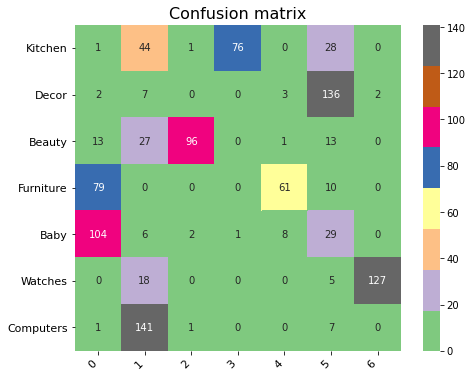

,cluster,effectives
Category,,
Kitchen,3,77
Decor,5,228
Beauty,2,100
Furniture,4,73
Baby,0,200
Watches,6,129
Computers,1,243


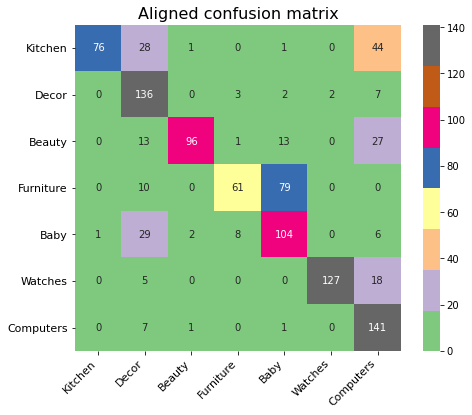

 ARI : 0.466329330294151
              precision    recall  f1-score   support

     Kitchen       0.99      0.51      0.67       150
       Decor       0.60      0.91      0.72       150
      Beauty       0.96      0.64      0.77       150
   Furniture       0.84      0.41      0.55       150
        Baby       0.52      0.69      0.59       150
     Watches       0.98      0.85      0.91       150
   Computers       0.58      0.94      0.72       150

    accuracy                           0.71      1050
   macro avg       0.78      0.71      0.70      1050
weighted avg       0.78      0.71      0.70      1050

Clustering sur features extracted by VGG16


In [14]:
# for loading/processing the images  
from keras.preprocessing.image import load_img 
from keras.preprocessing.image import img_to_array 
from keras.applications.vgg16 import preprocess_input 

# models 
from keras.applications.vgg16 import VGG16 
from keras.models import Model

# clustering and dimension reduction
from sklearn.cluster import KMeans
from sklearn.decomposition import PCA

# for everything else
import os
import numpy as np
import matplotlib.pyplot as plt
from random import randint
import pandas as pd
import pickle

        
            
vgg16 = VGG16()
model = Model(inputs = vgg16.inputs, outputs = vgg16.layers[-2].output)

def extract_features(file, model):
    # load the image as a 224x224 array
    img = load_img(path+file, target_size=(224,224))
    # convert from 'PIL.Image.Image' to numpy array
    img = np.array(img) 
    # reshape the data for the model reshape(num_of_samples, dim 1, dim 2, channels)
    reshaped_img = img.reshape(1,224,224,3) 
    # prepare image for model
    imgx = preprocess_input(reshaped_img)
    # get the feature vector
    features = model.predict(imgx, use_multiprocessing=True)
    return features
   
def dataset_features(model,image_list,vector_length):
    data_ = {}
    save_path = r"./FEATURE_VECTORS"

    # lop through each image in the dataset
    # for image in data.image:
    for _ , image in tenumerate(image_list,desc='Feature extraction '):
        # try to extract the features and update the dictionary
        try:
            feat = extract_features(image,model)
#         print(i_,feat.shape)
            data_[image] = feat
        # if something fails, save the extracted features as a pickle file (optional)
        except:
            print('On {} feature extraction failed'.format(image))
            with open(save_path,'wb') as file:
                pickle.dump(data_,file)
    # get a list of just the features
    feat = np.array(list(data_.values()))

    # reshape so that there are 1050 samples of 4096 vectors
    feat = feat.reshape(-1,vector_length)
    print('Features extracted {}'.format(feat.shape))
    return feat

print('         Model VGG16 ')

feat_vgg16 = dataset_features(model,data.image,4096)
joblib.dump(feat_vgg16,'Images/FEAT_VGG16')

def pca_reduction_and_clustering(features):
    # reduce the amount of dimensions in the feature vector
    print("Dimensions dataset avant réduction PCA : ", features.shape)
    pca = PCA(n_components=.99, random_state=22)
    pca.fit(features)
    X = pca.transform(features)
    print("Dimensions dataset après réduction PCA : ", X.shape)

    # cluster on feature vectors
    print('Computing clusters....')
    # kmeans = KMeans(n_clusters=len(unique_labels), random_state=22)
    kmeans = KMeans(n_clusters=7, random_state=22)
    kmeans.fit(X)
    print('done.')
    return kmeans.labels_

pred_labels_vgg16=pca_reduction_and_clustering(feat_vgg16)

title='features extracted by VGG16'
# Evaluate and store metrics results)
append_dict(results, {'title'   : title,
                     'metrics' : clustering_evaluate(pred_labels_vgg16, data.cat_code,cat['index'])
                     }
           )  

print('Clustering sur '+title)


## Visualisation of images in each cluster

In cluster image with VGG16 features extractor 
Create groups of images per cluster...
done.


Printing images by cluster:   0%|          | 0/7 [00:00<?, ?it/s]

Clipping cluster 0 size from 200 to 30


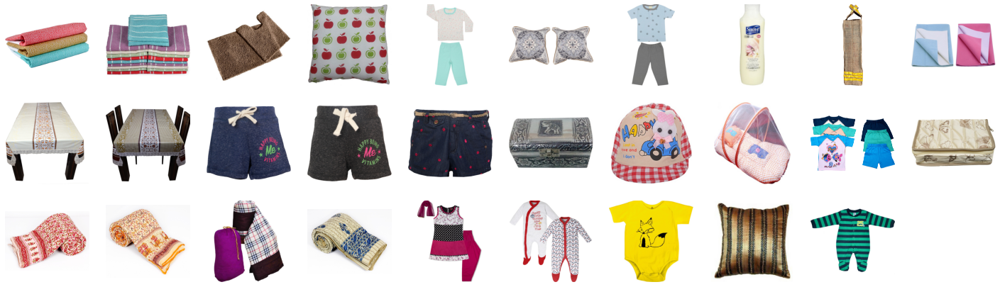

Clipping cluster 1 size from 243 to 30


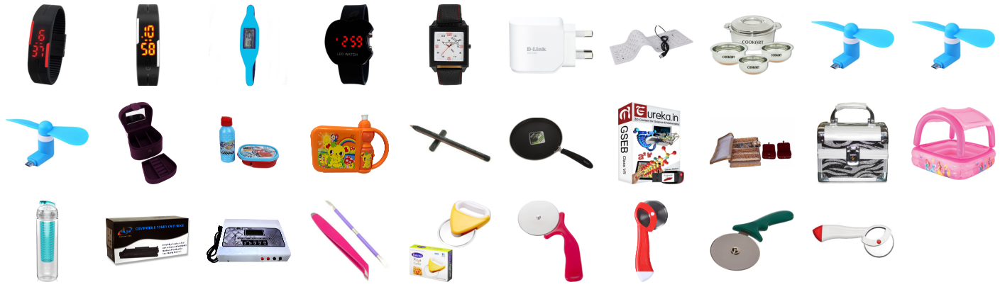

Clipping cluster 2 size from 100 to 30


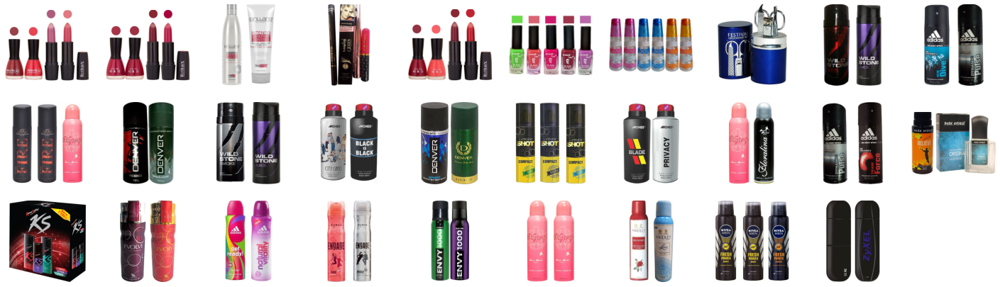

Clipping cluster 3 size from 77 to 30


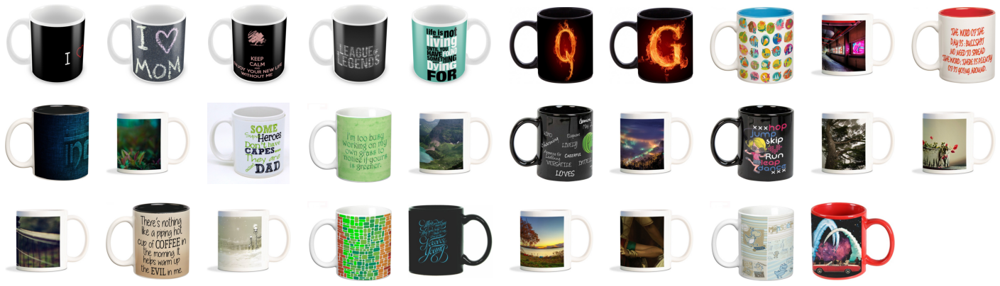

Clipping cluster 4 size from 73 to 30


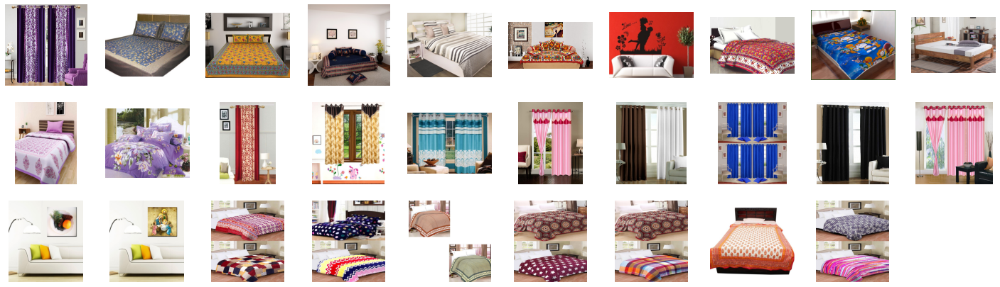

Clipping cluster 5 size from 228 to 30


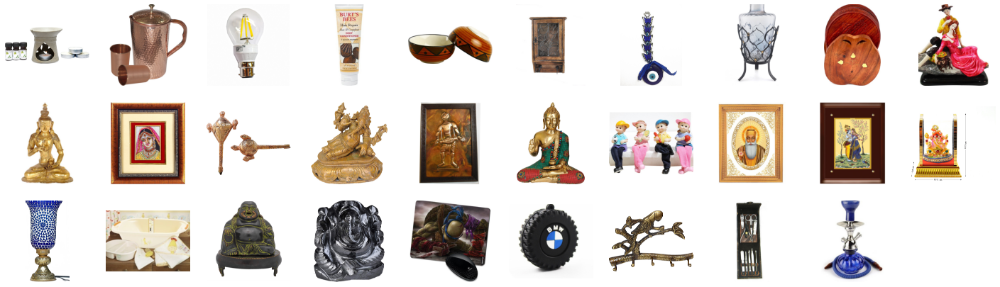

Clipping cluster 6 size from 129 to 30


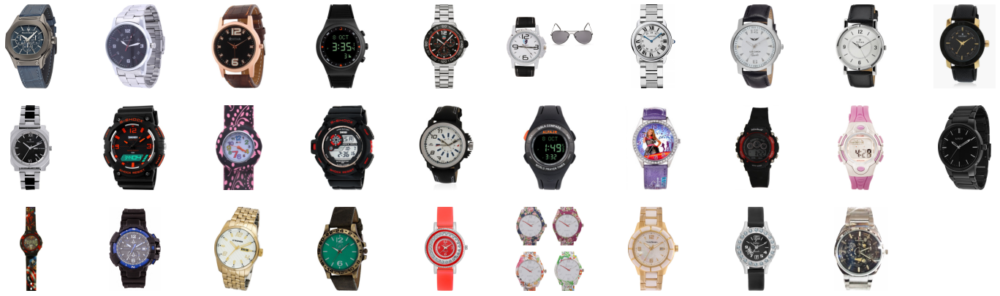

In [15]:
# Show a sample of 30 image in each cluster for visual verification
print('In cluster image with VGG16 features extractor ')
view_cluster(pred_labels_vgg16)

# ResNet50

* Feature extraction and clustering evaluation

         Model ResNet50 


Feature extraction :   0%|          | 0/1050 [00:00<?, ?it/s]

C:\Users\demo\anaconda3\envs\Pyth3 Tab9 PyCaret\lib\site-packages\PIL\Image.py:2847: DecompressionBombWarning: Image size (93680328 pixels) exceeds limit of 89478485 pixels, could be decompression bomb DOS attack.
  warnings.warn(


Features extracted (1050, 2048)
Dimensions dataset avant réduction PCA :  (1050, 2048)
Dimensions dataset après réduction PCA :  (1050, 722)
Computing clusters....
done.


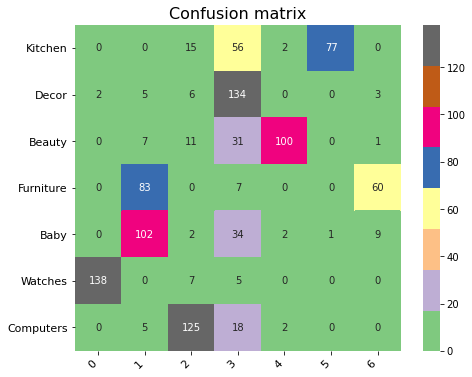

,cluster,effectives
Category,,
Kitchen,5,78
Decor,3,285
Beauty,4,106
Furniture,6,73
Baby,1,202
Watches,0,140
Computers,2,166


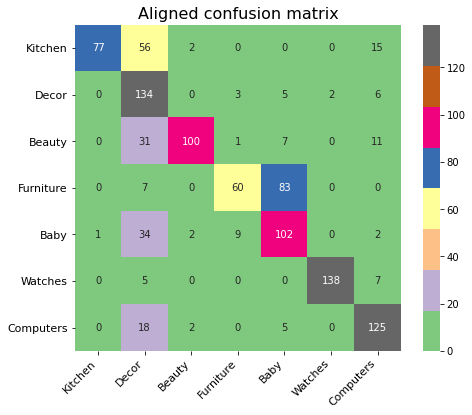

 ARI : 0.4613154559389895
              precision    recall  f1-score   support

     Kitchen       0.99      0.51      0.68       150
       Decor       0.47      0.89      0.62       150
      Beauty       0.94      0.67      0.78       150
   Furniture       0.82      0.40      0.54       150
        Baby       0.50      0.68      0.58       150
     Watches       0.99      0.92      0.95       150
   Computers       0.75      0.83      0.79       150

    accuracy                           0.70      1050
   macro avg       0.78      0.70      0.70      1050
weighted avg       0.78      0.70      0.70      1050

Clustering sur features extracted by ResNet50
Clustering evaluation features extracted by ResNet50


In [16]:
                            ######################
                            #      ResNet50      #
                            ######################
# Import pretrained model from Keras
from keras.applications.resnet50 import ResNet50 

# Import specific preprocess for that model from keras
from keras.applications.resnet50 import preprocess_input 

# Remove classification layers for feature extraction
resnet50 = ResNet50()
model = Model(inputs = resnet50.inputs, outputs = resnet50.layers[-2].output)

print('         Model ResNet50 ')

# Extract features for all images in dataset
feat_resnet50 = dataset_features(model,data.image,2048)
joblib.dump(feat_resnet50,'Images/FEAT_ResNet50')

# Make clusters from these features
pred_labels_resnet50=pca_reduction_and_clustering(feat_resnet50)

# Evaluate the quality
title='features extracted by ResNet50'
# Evaluate and store metrics results)
append_dict(results, {'title'   : title,
                     'metrics' : clustering_evaluate(pred_labels_resnet50, data.cat_code,cat['index'])
                     }
           )  
# clustering_evaluate(labels, data.cat_code,cat['index'])
print('Clustering sur '+title)


## Visualisation of images in each cluster

In cluster image with ResNet50 features extractor 
Create groups of images per cluster...
done.


Printing images by cluster:   0%|          | 0/7 [00:00<?, ?it/s]

Clipping cluster 0 size from 140 to 30


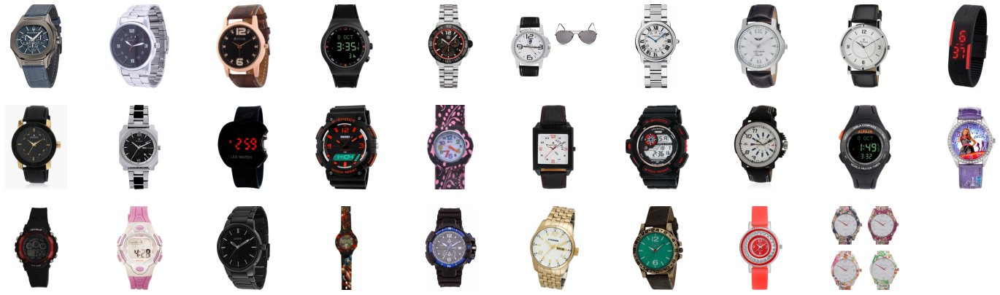

Clipping cluster 1 size from 202 to 30


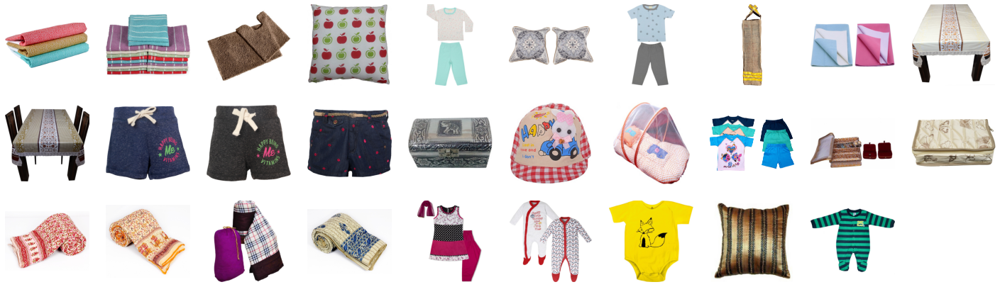

Clipping cluster 2 size from 166 to 30


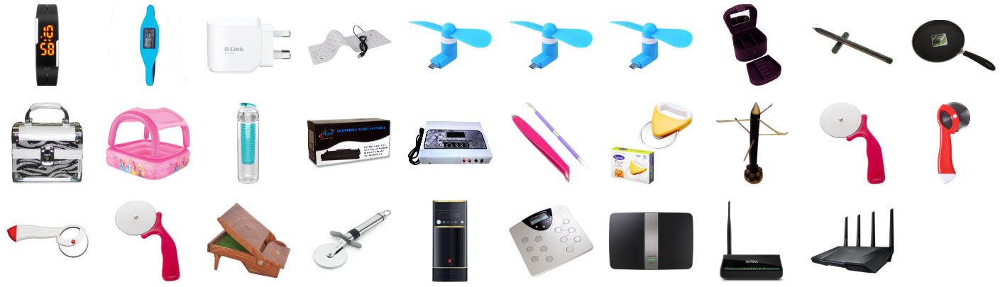

Clipping cluster 3 size from 285 to 30


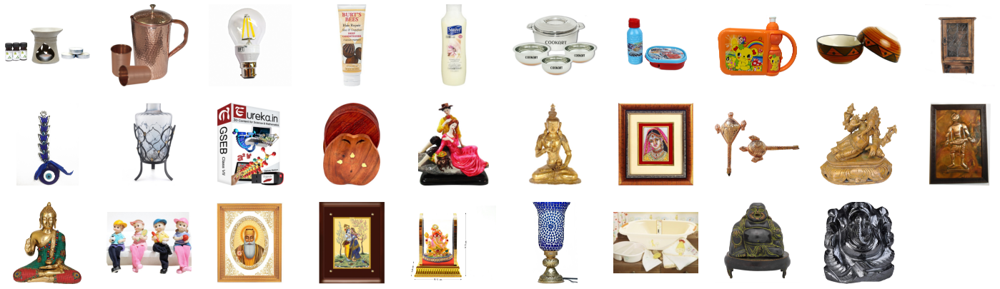

Clipping cluster 4 size from 106 to 30


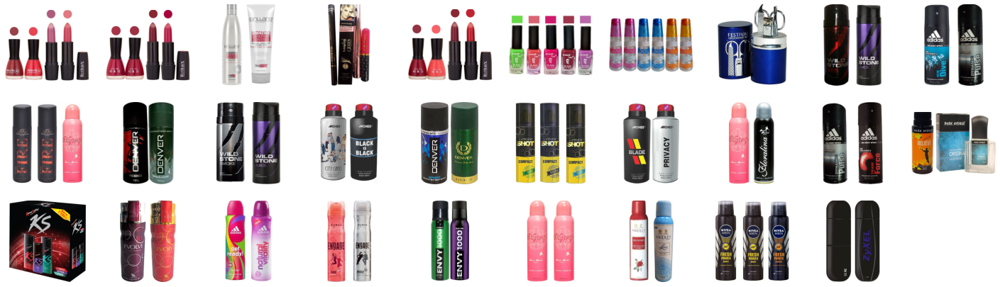

Clipping cluster 5 size from 78 to 30


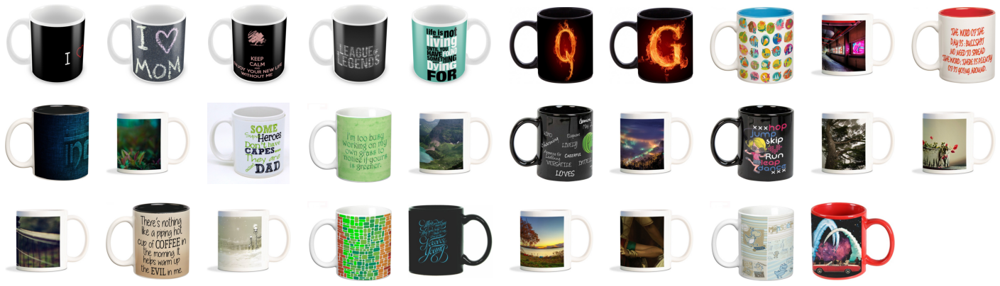

Clipping cluster 6 size from 73 to 30


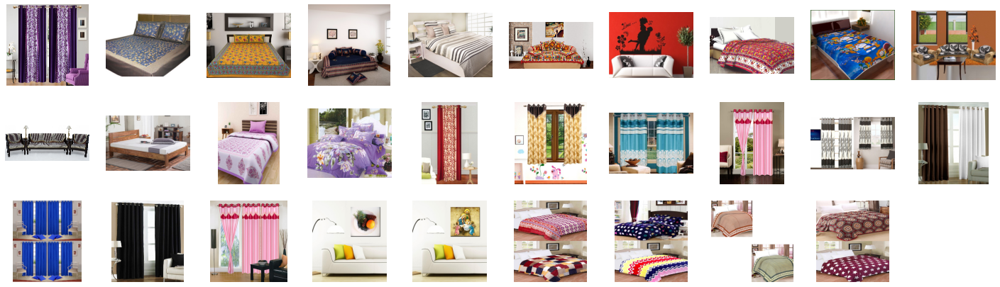

In [17]:
# Show a sample of 30 image in each cluster for visual verification
print('In cluster image with ResNet50 features extractor ')
view_cluster(pred_labels_resnet50)

# Résultats

In [19]:
# Create data frame from resluts dictionaryy


def highlight_max(s):
    '''
    highlight the maximum in a Series green.
    '''
    is_max = s == s.max()
    return ['background-color: lightgreen' if v else '' for v in is_max]
def highlight_min(s):
    '''
    highlight the minmum in a Series red.
    '''
    is_max = s == s.min()
    return ['background-color: lightcoral' if v else '' for v in is_max]


# unpack tuples and create result data frame
def dict_to_df(dic):
    # dict to data frame
    results_all=pd.DataFrame(dic)
    # unpack metrics tuple
    results_all['precision']=[tup[0][0] for tup in results_all.metrics]
    results_all['recall']=[tup[0][1] for tup in results_all.metrics]
    results_all['f1_score']=[tup[0][2] for tup in results_all.metrics]
    results_all['ARI']=[tup[1] for tup in results_all.metrics]
    # drop tuples
    results_all.drop(['metrics'],axis=1,inplace=True)
    # set title as index
    results_all.set_index('title',inplace=True)
#     # columns to highligth
#     subset=['precision','recall','f1_score','ARI']
    # return dataframe
    return results_all.style.apply(highlight_max).apply(highlight_min).format('{:.2%}')

results_images = dict_to_df(results)
results_images

,precision,recall,f1_score,ARI
title,,,,
features extracted by VGG16,78.06%,70.57%,70.38%,46.63%
features extracted by ResNet50,78.09%,70.10%,70.48%,46.13%


In [20]:
print(' Executé en : ', datetime.timedelta(seconds=(time.time() - start_time)))

 Executé en :  0:09:15.256780
